# Regression Problem

In [1]:
# Load the data
import pandas as pd
df=pd.read_csv("boston.csv")

In [2]:
df.head()

,CRIM,ZN,INDUS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,HOUSEPRICE
0,0.00632,18.0,2.31,0.538,6.575,65.2,4.0900,1,296,15.3,396.90,4.98,24.0
1,0.02731,0.0,7.07,0.469,6.421,78.9,4.9671,2,242,17.8,396.90,9.14,21.6
2,0.02729,0.0,7.07,0.469,7.185,61.1,4.9671,2,242,17.8,392.83,4.03,34.7
3,0.03237,0.0,2.18,0.458,6.998,45.8,6.0622,3,222,18.7,394.63,2.94,33.4
4,0.06905,0.0,2.18,0.458,7.147,54.2,6.0622,3,222,18.7,396.90,5.33,36.2


In [3]:
!pip install pandas-profiling

Defaulting to user installation because normal site-packages is not writeable
You should consider upgrading via the '/usr/local/bin/python3 -m pip install --upgrade pip' command.


# EDA

In [4]:
from pandas_profiling import ProfileReport

In [5]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/27 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [6]:
# separating outcome and features
x=df.drop(columns='HOUSEPRICE') # indpendent var
y=df.HOUSEPRICE  # Dependent var

# split the data into train and test
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(x,y,random_state=0)

#Standardise data
from sklearn.preprocessing import StandardScaler
st=StandardScaler()

x_train_std=st.fit_transform(x_train)
x_test_std=st.fit_transform(x_test)

In [7]:
x_train_std

array([[-0.38774288,  0.42637011, -0.74491444, ...,  0.27878885,
         0.34049624,  0.82212111],
       [-0.39842849,  0.5525335 , -0.84901832, ...,  0.55287698,
         0.42774893, -0.46241699],
       [-0.39825738,  1.18335044, -0.66648002, ..., -0.40643148,
         0.34184377, -0.90310809],
       ...,
       [-0.39263969, -0.49882807, -0.15309105, ..., -0.31506877,
         0.40091059, -0.31227617],
       [-0.38313854, -0.49882807, -0.59517599, ..., -0.26938741,
         0.38103449,  0.86938766],
       [-0.39407658, -0.49882807, -1.003035  , ..., -0.86324503,
         0.42774893,  0.29801844]])

In [8]:
x_train_std.shape

(379, 12)

In [9]:
!pip install livelossplot

Defaulting to user installation because normal site-packages is not writeable
You should consider upgrading via the '/usr/local/bin/python3 -m pip install --upgrade pip' command.


In [10]:
# Build the model
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Dense
from livelossplot import PlotLossesKerasTF

In [11]:
model=Sequential()
model.add(Input(shape=(12,),name="Input Layer"))
model.add(Dense(15,activation='relu',name="Hidden1"))
model.add(Dense(15,activation='relu',name="Hidden2"))
model.add(Dense(1,activation='relu',name='OutputLayer'))

model.compile(loss='mse',optimizer='adam')

In [12]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Hidden1 (Dense)             (None, 15)                195       
                                                                 
 Hidden2 (Dense)             (None, 15)                240       
                                                                 
 OutputLayer (Dense)         (None, 1)                 16        
                                                                 
Total params: 451
Trainable params: 451
Non-trainable params: 0
_________________________________________________________________


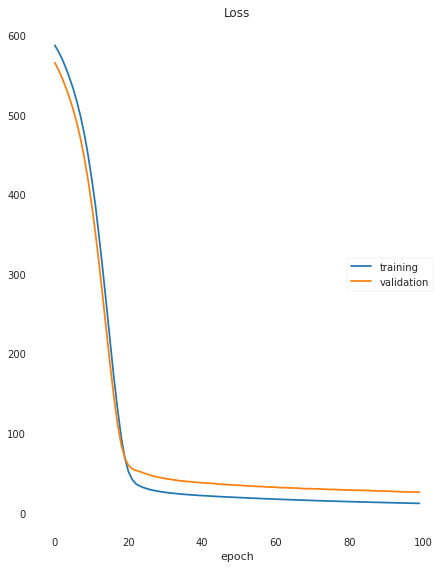

Loss
	training         	 (min:   11.879, max:  587.378, cur:   11.879)
	validation       	 (min:   25.923, max:  565.524, cur:   25.923)
12/12 [==============================] - 0s 39ms/step - loss: 11.8794 - val_loss: 25.9228


In [13]:
# train the model
model.fit(x_train_std,y_train,epochs=100,validation_data=(x_test_std,y_test),callbacks=[PlotLossesKerasTF()])

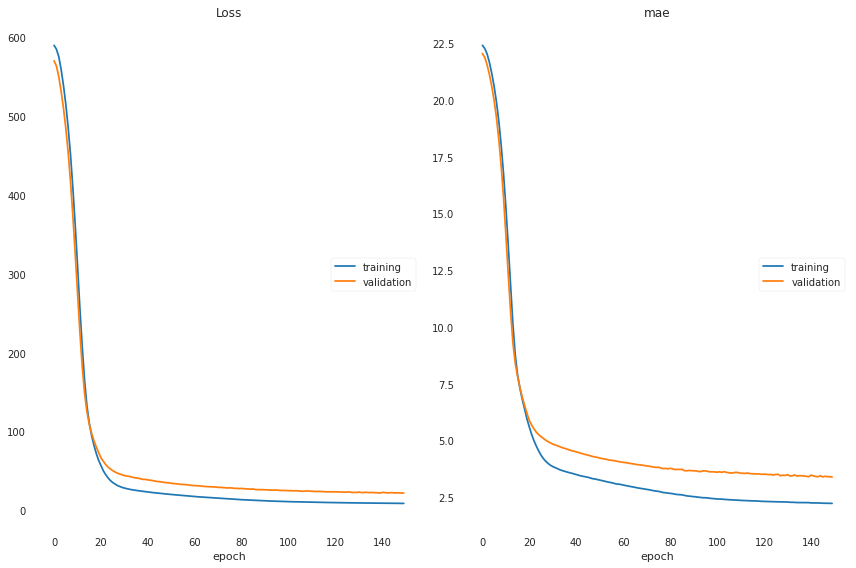

Loss
	training         	 (min:    9.010, max:  589.771, cur:    9.010)
	validation       	 (min:   22.073, max:  570.124, cur:   22.073)
mae
	training         	 (min:    2.224, max:   22.419, cur:    2.224)
	validation       	 (min:    3.383, max:   22.056, cur:    3.383)
12/12 [==============================] - 1s 66ms/step - loss: 9.0099 - mae: 2.2243 - val_loss: 22.0727 - val_mae: 3.3830


In [14]:
model=Sequential()
model.add(Input(shape=(12,),name="Input Layer"))
model.add(Dense(15,activation='relu',name="Hidden1"))
model.add(Dense(15,activation='relu',name="Hidden2"))
model.add(Dense(1,activation='relu',name='OutputLayer'))
model.compile(loss='mse',optimizer='adam',metrics=['mae'])
# train the model
model.fit(x_train_std,y_train,epochs=150,validation_data=(x_test_std,y_test),callbacks=[PlotLossesKerasTF()])

In [ ]:
# Increase number of layers
model=Sequential()
model.add(Input(shape=(12,),name="Input Layer"))
model.add(Dense(15,activation='relu',name="Hidden1"))
model.add(Dense(15,activation='relu',name="Hidden2"))
model.add(Dense(25,activation='relu',name="Hidden3"))
model.add(Dense(30,activation='relu',name="Hidden4"))
model.add(Dense(1,activation='relu',name='OutputLayer'))
model.compile(loss='mse',optimizer='adam',metrics=['mae'])
# train the model
model.fit(x_train_std,y_train,epochs=100,validation_data=(x_test_std,y_test),callbacks=[PlotLossesKerasTF()])

In [ ]:
# Perceptron
model=Sequential()
model.add(Input(shape=(12,),name="Input Layer"))
model.add(Dense(1,activation='relu',name='OutputLayer'))
model.compile(loss='mse',optimizer='adam',metrics=['mae'])
# train the model
model.fit(x_train_std,y_train,epochs=100,validation_data=(x_test_std,y_test),callbacks=[PlotLossesKerasTF()])

In [ ]:
# Increase number of layers
model=Sequential()
model.add(Input(shape=(12,),name="Input Layer"))
model.add(Dense(15,activation='relu',name="Hidden1"))
model.add(Dense(50,activation='relu',name="Hidden2"))
model.add(Dense(1,activation='relu',name='OutputLayer'))
model.compile(loss='mse',optimizer='adam',metrics=['mae'])
# train the model
model.fit(x_train_std,y_train,epochs=100,validation_data=(x_test_std,y_test),callbacks=[PlotLossesKerasTF()])

In [15]:
model.predict(x_test_std)

array([[27.336079 ],
       [27.606422 ],
       [26.92252  ],
       [11.771721 ],
       [19.789122 ],
       [20.83326  ],
       [23.856863 ],
       [23.169718 ],
       [17.818943 ],
       [21.587627 ],
       [ 8.01332  ],
       [12.104276 ],
       [15.620222 ],
       [ 9.086166 ],
       [46.76963  ],
       [35.019466 ],
       [23.731535 ],
       [40.846657 ],
       [33.97906  ],
       [24.552677 ],
       [26.122473 ],
       [23.21263  ],
       [21.602707 ],
       [28.863512 ],
       [23.547777 ],
       [21.313873 ],
       [18.05672  ],
       [15.638452 ],
       [45.19995  ],
       [17.460012 ],
       [15.626872 ],
       [18.214657 ],
       [17.416105 ],
       [20.257364 ],
       [30.154772 ],
       [20.945984 ],
       [ 8.009212 ],
       [27.617813 ],
       [15.795507 ],
       [12.317561 ],
       [26.823502 ],
       [24.369913 ],
       [22.14531  ],
       [16.913465 ],
       [24.45746  ],
       [24.91361  ],
       [21.24186  ],
       [18.31

In [16]:
y_test

329    22.6
371    50.0
219    23.0
403     8.3
78     21.2
       ... 
49     19.4
498    21.2
309    20.3
124    18.8
306    33.4
Name: HOUSEPRICE, Length: 127, dtype: float64

In [17]:
# save model
model.save("BostonModel.h5")

In [18]:
df_new=pd.read_csv("boston new data.csv")

In [19]:
df_new

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT
0,0.653,16,2.2,0,0.538,6.575,65.2,4.09,1,296,15.3,396.9,4.98
1,0.005,0,3.4,0,0.600,7.000,45.0,5.00,2,300,17.0,300.0,6.00


In [20]:
df_new.drop(columns="CHAS",inplace=True)

In [21]:
df_new_std=st.fit_transform(df_new)

In [22]:
#load and use the model
from tensorflow.keras.models import load_model
boston_model = load_model("BostonModel.h5")
boston_model.predict(df_new_std)

array([[18.122232 ],
       [13.5603485]], dtype=float32)